In [4]:
import os, sys
sys.path.append("C:/Users/piyalong/CrowdCounting-P2PNet/")

import argparse
import datetime
import random
import time
from pathlib import Path

import torch
import torchvision.transforms as standard_transforms
import numpy as np

from PIL import Image
import cv2
from crowd_datasets import build_dataset
from engine import *
from models import build_model

import warnings
warnings.filterwarnings('ignore')

from matplotlib import pyplot as plt
%matplotlib inline
torch.cuda.empty_cache() 
import json
from matplotlib.patches import Circle
import pandas as pd



# Build model

In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Backbone_VGG(nn.Module):
    def __init__(self):
        super(Backbone_VGG, self).__init__()
        self.body1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        
        self.body2 = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        
        self.body3 = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )
        
        self.body4 = nn.Sequential(
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )
        
    def forward(self, x):
        out1 = self.body1(x)
        out2 = self.body2(out1)
        out3 = self.body3(out2)
        out4 = self.body4(out3)
        
        return out1, out2, out3, out4


class RegressionModel(nn.Module):
    def __init__(self):
        super(RegressionModel, self).__init__()
        self.conv1 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.act1 = nn.ReLU()
        self.conv2 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.act2 = nn.ReLU()
        self.conv3 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.act3 = nn.ReLU()
        self.conv4 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
        self.act4 = nn.ReLU()
        self.output = nn.Conv2d(256, 8, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        out = self.conv1(x)
        out = self.act1(out)
        out = self.conv2(out)
        out = self.act2(out)
        out = self.conv3(out)
        out = self.act3(out)
        out = self.conv4(out)
        out = self.act4(out)
        out = self.output(out)
        
        out = out.permute(0, 2, 3, 1)

        return out.contiguous().view(out.shape[0], -1, 2)


class ClassificationModel(nn.Module):
    def __init__(self, num_features_in=256, num_anchor_points=4, num_classes=2, prior=0.01, feature_size=256):
        super(ClassificationModel, self).__init__()

        self.num_classes = num_classes
        self.num_anchor_points = num_anchor_points

        self.conv1 = nn.Conv2d(num_features_in, feature_size, kernel_size=3, padding=1)
        self.act1 = nn.ReLU()

        self.conv2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act2 = nn.ReLU()

        self.conv3 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act3 = nn.ReLU()

        self.conv4 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act4 = nn.ReLU()

        self.output = nn.Conv2d(feature_size, num_anchor_points * num_classes, kernel_size=3, padding=1)
        self.output_act = nn.Sigmoid()
        
    # sub-branch forward
    def forward(self, x):
        out = self.conv1(x)
        out = self.act1(out)

        out = self.conv2(out)
        out = self.act2(out)

        out = self.output(out)

        out1 = out.permute(0, 2, 3, 1)

        batch_size, width, height, _ = out1.shape

        out2 = out1.view(batch_size, width, height, self.num_anchor_points, self.num_classes)

        return out2.contiguous().view(x.shape[0], -1, self.num_classes)

class AnchorPoints(nn.Module):
    def __init__(self, pyramid_levels=None, strides=None, row=3, line=3):
        super(AnchorPoints, self).__init__()

        if pyramid_levels is None:
            self.pyramid_levels = [3, 4, 5, 6, 7]
        else:
            self.pyramid_levels = pyramid_levels

        if strides is None:
            self.strides = [2 ** x for x in self.pyramid_levels]

        self.row = row
        self.line = line

    def forward(self, image):
        image_shape = image.shape[2:]
        image_shape = np.array(image_shape)
        image_shapes = [(image_shape + 2 ** x - 1) // (2 ** x) for x in self.pyramid_levels]

        all_anchor_points = np.zeros((0, 2)).astype(np.float32)
        # get reference points for each level
        for idx, p in enumerate(self.pyramid_levels):
            anchor_points = generate_anchor_points(2**p, row=self.row, line=self.line)
            shifted_anchor_points = shift(image_shapes[idx], self.strides[idx], anchor_points)
            all_anchor_points = np.append(all_anchor_points, shifted_anchor_points, axis=0)

        all_anchor_points = np.expand_dims(all_anchor_points, axis=0)
        # send reference points to device
        if torch.cuda.is_available():
            return torch.from_numpy(all_anchor_points.astype(np.float32)).cuda()
        else:
            return torch.from_numpy(all_anchor_points.astype(np.float32))
def generate_anchor_points(stride=16, row=3, line=3):
    row_step = stride / row
    line_step = stride / line

    shift_x = (np.arange(1, line + 1) - 0.5) * line_step - stride / 2
    shift_y = (np.arange(1, row + 1) - 0.5) * row_step - stride / 2

    shift_x, shift_y = np.meshgrid(shift_x, shift_y)

    anchor_points = np.vstack((
        shift_x.ravel(), shift_y.ravel()
    )).transpose()

    return anchor_points

def shift(shape, stride, anchor_points):
    shift_x = (np.arange(0, shape[1]) + 0.5) * stride
    shift_y = (np.arange(0, shape[0]) + 0.5) * stride

    shift_x, shift_y = np.meshgrid(shift_x, shift_y)

    shifts = np.vstack((
        shift_x.ravel(), shift_y.ravel()
    )).transpose()

    A = anchor_points.shape[0]
    K = shifts.shape[0]
    all_anchor_points = (anchor_points.reshape((1, A, 2)) + shifts.reshape((1, K, 2)).transpose((1, 0, 2)))
    all_anchor_points = all_anchor_points.reshape((K * A, 2))

    return all_anchor_points


class Decoder(nn.Module):
    def __init__(self, C3_size, C4_size, C5_size, feature_size=256):
        super(Decoder, self).__init__()

        # upsample C5 to get P5 from the FPN paper
        self.P5_1 = nn.Conv2d(C5_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P5_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P5_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # add P5 elementwise to C4
        self.P4_1 = nn.Conv2d(C4_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P4_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P4_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # add P4 elementwise to C3
        self.P3_1 = nn.Conv2d(C3_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P3_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P3_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)


    def forward(self, inputs):
        C3, C4, C5 = inputs

        P5_x = self.P5_1(C5)
        P5_upsampled_x = self.P5_upsampled(P5_x)
        P5_x = self.P5_2(P5_x)

        P4_x = self.P4_1(C4)
        P4_x = P5_upsampled_x + P4_x
        P4_upsampled_x = self.P4_upsampled(P4_x)
        P4_x = self.P4_2(P4_x)

        P3_x = self.P3_1(C3)
        P3_x = P3_x + P4_upsampled_x
        P3_x = self.P3_2(P3_x)

        return [P3_x, P4_x, P5_x]


class P2PNet(nn.Module):
    def __init__(self):
        super(P2PNet, self).__init__()
        self.backbone = Backbone_VGG()
        self.regression = RegressionModel()
        self.classification = ClassificationModel()
        self.anchor_points = AnchorPoints(pyramid_levels=[3,], row=2, line=2)
        self.fpn =  Decoder(256, 512, 512)

    def forward(self, x):
        features = self.backbone(x)
        features_fpn = self.fpn([features[1], features[2], features[3]])
        
        batch_size = features[0].shape[0]
        regression_out = self.regression(features_fpn[1]) * 100 # 8x
        classification_out = self.classification(features_fpn[1])
        anchor_points_out = self.anchor_points(x).repeat(batch_size, 1, 1)
        
        output_coord = regression_out.to(device) + anchor_points_out.to(device)
        
        output_class = classification_out
        out = {'pred_logits': output_class, 'pred_points': output_coord}
       
        return out


# Test model

In [46]:
# Create an instance of the P2PNet model
model = P2PNet()

# Print the model architecture

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

PATH='C:/Users/piyalong/PointTracking/20230506/ckpts/best_mae.pth'
checkpoint = torch.load(PATH, map_location=device)
model.load_state_dict(checkpoint['model'])

model.to(device)

P2PNet(
  (backbone): Backbone_VGG(
    (body1): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace=True)
      (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace=True)
    )
    (body2): Sequential(
      (0): MaxPool2d(ke

14


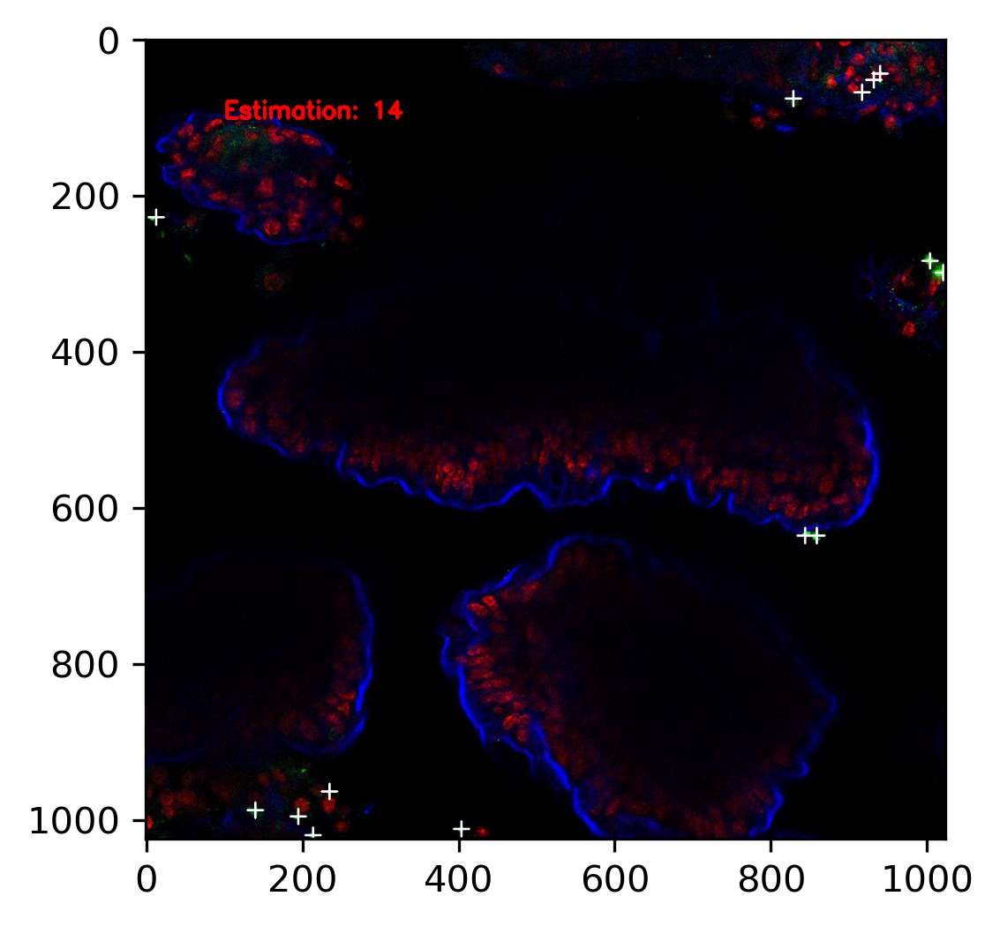

In [47]:

# convert to eval mode
model.eval()
# create the pre-processing transform
transform = standard_transforms.Compose([
    standard_transforms.ToTensor(), 
    standard_transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# set your image path here
img_path = 'D:/20230426CDI/data/test/WT-1_ID_PIC-1_JOA100_2.jpg'
# load the images
img_raw = Image.open(img_path).convert('RGB')
# round the size
width, height = img_raw.size
new_width = width // 128 * 128
new_height = height // 128 * 128
img_raw = img_raw.resize((new_width, new_height), Image.ANTIALIAS)
# pre-proccessing
img = transform(img_raw)

samples = torch.Tensor(img).unsqueeze(0)
samples = samples.to(device)
# run inference
outputs = model(samples)
outputs_scores = torch.nn.functional.softmax(outputs['pred_logits'], -1)[:, :, 1][0]

outputs_points = outputs['pred_points'][0]

threshold = 0.5
# filter the predictions
points = outputs_points[outputs_scores > threshold].detach().cpu().numpy().tolist()
predict_cnt = int((outputs_scores > threshold).sum())
scores= outputs_scores[outputs_scores > threshold]
outputs_scores = torch.nn.functional.softmax(outputs['pred_logits'], -1)[:, :, 1][0]

# draw the predictions
size = 4
img_to_draw = cv2.cvtColor(np.array(img_raw), cv2.COLOR_RGB2BGR)

img_to_draw = cv2.putText(img_to_draw,"Estimation: "+str(len(points)), (100,100), cv2.FONT_HERSHEY_SIMPLEX,1, (0,0,255), 3)
print(len(points))
for p in points:
    # img_to_draw = cv2.circle(img_to_draw, (int(p[0]), int(p[1])), size, (0, 0, 255), -1)
    cv2.drawMarker(img_to_draw, (int(p[0]), int(p[1])), (255, 255, 255), cv2.MARKER_CROSS, markerSize=20,thickness=2)
    
# cv2.rectangle(img_to_draw, (100, 100), (120, 140), (255,255,255), 2)
# save the visualized image
# cv2.imshow('ImageWindow',img_to_draw)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

cv2.imwrite(os.path.join(args.output_dir, 'pred{}.jpg'.format(predict_cnt)), img_to_draw)

img_to_draw = cv2.cvtColor(img_to_draw, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(dpi=300)

plt.imshow(img_to_draw)

In [48]:
samples.size()

torch.Size([1, 3, 1024, 1024])

In [49]:
x = torch.randn(1, 3, 224, 224).to(device)
y = model(x)

In [50]:
samples.size()

torch.Size([1, 3, 1024, 1024])

In [51]:
x.size()

torch.Size([1, 3, 224, 224])

In [52]:
outputs['pred_logits'].shape

torch.Size([1, 65536, 2])

In [53]:
outputs['pred_points'].shape

torch.Size([1, 65536, 2])

In [54]:
# def random_crop(img, den, num_patch=4):
num_patch=4
den=np.array(points)
half_h = 128
half_w = 128
result_img = np.zeros([num_patch, img.shape[0], half_h, half_w])
result_den = []
# crop num_patch for each image
for i in range(num_patch):
    start_h = random.randint(0, img.size(1) - half_h)
    start_w = random.randint(0, img.size(2) - half_w)
    end_h = start_h + half_h
    end_w = start_w + half_w
    # copy the cropped rect
    result_img[i] = img[:, start_h:end_h, start_w:end_w]
    # copy the cropped points
    idx = (den[:, 0] >= start_w) & (den[:, 0] <= end_w) & (den[:, 1] >= start_h) & (den[:, 1] <= end_h)
    # shift the corrdinates
    record_den = den[idx]
    record_den[:, 0] -= start_w
    record_den[:, 1] -= start_h
    print(record_den)
    result_den.append(record_den)

    # return result_img, result_den

[]
[[ 63.27728271  94.49914551]
 [118.66523743 102.86590576]]
[]
[]


In [55]:
np.array(den)[:,0]

array([ 940.63031006,  932.85784912,  917.3649292 ,  829.42590332,
         13.46268559, 1004.26708984, 1021.89172363,  844.62420654,
        859.87091064,  235.9936676 ,  140.27728271,  195.66523743,
        404.83911133,  214.00654602])

In [56]:
result_den

[array([], shape=(0, 2), dtype=float64),
 array([[ 63.27728271,  94.49914551],
        [118.66523743, 102.86590576]]),
 array([], shape=(0, 2), dtype=float64),
 array([], shape=(0, 2), dtype=float64)]

In [57]:
start_h,end_h

(268, 396)

In [58]:
start_w,end_w

(763, 891)

In [59]:
result_img[0].shape

(3, 128, 128)

# Prediction Function

In [60]:
    
def predict(img_path,    threshold = 0.05):

    img_raw = Image.open(img_path).convert('RGB')

    img = transform(img_raw)

    samples = torch.Tensor(img).unsqueeze(0)
    samples = samples.to(device)
    # run inference
    outputs = model(samples)
    outputs_scores = torch.nn.functional.softmax(outputs['pred_logits'], -1)[:, :, 1][0]

    outputs_points = outputs['pred_points'][0]

    # filter the predictions
    points = outputs_points[outputs_scores > threshold].detach().cpu().numpy().tolist()
    predict_cnt = int((outputs_scores > threshold).sum())
    scores= outputs_scores[outputs_scores > threshold]
    outputs_scores = torch.nn.functional.softmax(outputs['pred_logits'], -1)[:, :, 1][0]

    predicted_points=np.array(points).astype(int)
    return predicted_points

In [61]:
predicted_points=predict(img_path,    threshold = 0.05)

In [62]:
predicted_points

array([[ 996,   35],
       [ 940,   43],
       [ 932,   51],
       [ 917,   67],
       [ 829,   75],
       [ 828,   84],
       [  13,  227],
       [  53,  277],
       [  48,  281],
       [1004,  283],
       [1021,  298],
       [1021,  338],
       [1021,  341],
       [ 196,  564],
       [ 844,  635],
       [ 859,  635],
       [ 235,  963],
       [ 140,  987],
       [ 195,  995],
       [ 404, 1011],
       [  17, 1016],
       [  17, 1021],
       [ 214, 1019]])

In [63]:
txt_file = img_path[:-4]+".txt"


# Get GT

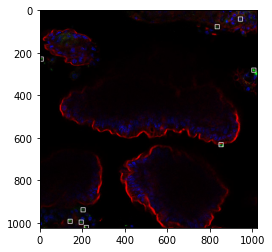

In [64]:
import re
img_raw = Image.open(img_path).convert('RGB')
img_to_draw = cv2.cvtColor(np.array(img_raw), cv2.COLOR_RGB2BGR)

ground_truth_pixel_points=[]
with open(txt_file) as file:
    for pt in file.readlines():
        x,y=pt.split(" ")
        numbersx = re.findall('\d+', x)[0]
        numbersy = re.findall('\d+', y)[0]
        # print(int(numbersx),int(numbersy))
        ground_truth_pixel_points.append([int(numbersx),int(numbersy)])
        cv2.drawMarker(img_to_draw, (int(numbersx),int(numbersy)), (255, 255, 255), cv2.MARKER_SQUARE, markerSize=20,thickness=2)
plt.imshow(img_to_draw)

# Get GT function

In [65]:
import re
def get_gt(txt_file):

    ground_truth_pixel_points=[]
    with open(txt_file) as file:
        for pt in file.readlines():
            x,y=pt.split(" ")
            numbersx = re.findall('\d+', x)[0]
            numbersy = re.findall('\d+', y)[0]
            ground_truth_pixel_points.append([int(numbersx),int(numbersy)])

    return ground_truth_pixel_points



In [66]:
gt_points=get_gt(txt_file)
gt_points

[[5, 230],
 [141, 992],
 [193, 996],
 [217, 1021],
 [202, 938],
 [850, 632],
 [1004, 282],
 [832, 78],
 [941, 42]]

In [67]:
from scipy.optimize import linear_sum_assignment
import numpy as np
from scipy.spatial.distance import cdist

8 9 23


Text(0.5, 1.0, 'Recall: 88.89% Precision: 34.78%')

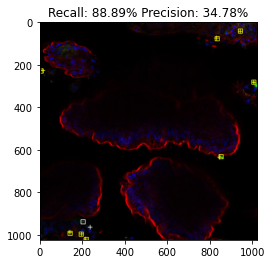

In [68]:

image = cv2.cvtColor(np.array(img_raw), cv2.COLOR_RGB2BGR)


cost_matrix=cdist(predicted_points, gt_points, 'euclidean')
square_size=20
tp=0
a=20

row_indices, col_indices = linear_sum_assignment(cost_matrix)

src_points=[]
target_points=[]

n_points_pred = len(predicted_points)
n_points_gt = len(gt_points)

        
for row, col in zip(row_indices, col_indices):
    if row < n_points_pred and col < n_points_gt:
        pred_point = predicted_points[row]
        gt_point = gt_points[col]
        if cost_matrix[row, col]<a:
            # print(pred_point)
            cv2.drawMarker(image, (gt_point), (255, 255, 0), cv2.MARKER_SQUARE, markerSize=square_size,thickness=2)
            cv2.drawMarker(image, (pred_point), (255, 255, 0), cv2.MARKER_CROSS, markerSize=square_size,thickness=2)
            tp+=1
        else:
            cv2.drawMarker(image, (gt_point), (255, 255, 255), cv2.MARKER_SQUARE, markerSize=square_size,thickness=2)
            cv2.drawMarker(image, (pred_point), (255, 255, 255), cv2.MARKER_CROSS, markerSize=square_size,thickness=2)

        # print(f"Predicted point {row} ({pred_point}) is assigned to ground truth point {col} ({gt_point}) with cost {cost_matrix[row, col]}")
    elif row < n_points_pred:
        pred_point = predicted_points[row]
        # print(f"Predicted point {row} ({pred_point}) is not assigned to any ground truth point")
        cv2.drawMarker(image, (pred_point), (255, 255, 255), cv2.MARKER_CROSS, markerSize=square_size,thickness=2)
    else:
        gt_point = gt_points[col]
        # print(f"Ground truth point {col} ({gt_point}) is not assigned to any predicted point")
        cv2.drawMarker(image, (gt_point), (255, 255, 255), cv2.MARKER_SQUARE, markerSize=square_size,thickness=2)
plt.imshow(image)
print(tp,n_points_gt,n_points_pred)
plt.title('Recall: {0:.2%} Precision: {1:.2%}'.format(tp/n_points_gt,tp/n_points_pred))

In [69]:
target_points

[]

In [70]:
src_points

[]

# Evalutation Function

In [71]:
def evaluate(img_path,predicted_points, gt_points):
    
    img_raw = Image.open(img_path).convert('RGB')
    image = cv2.cvtColor(np.array(img_raw), cv2.COLOR_RGB2BGR)
    
    cost_matrix=cdist(predicted_points, gt_points, 'euclidean')
    square_size=20
    tp=0
    a=20
    row_indices, col_indices = linear_sum_assignment(cost_matrix)

    src_points=[]
    target_points=[]

    n_points_pred = len(predicted_points)
    n_points_gt = len(gt_points)

    for row, col in zip(row_indices, col_indices):
        if row < n_points_pred and col < n_points_gt:
            pred_point = predicted_points[row]
            gt_point = gt_points[col]
            if cost_matrix[row, col]<a:
                # print(pred_point)
                cv2.drawMarker(image, (gt_point), (255, 255, 0), cv2.MARKER_SQUARE, markerSize=square_size,thickness=2)
                cv2.drawMarker(image, (pred_point), (255, 255, 0), cv2.MARKER_CROSS, markerSize=square_size,thickness=2)
                tp+=1
            else:
                cv2.drawMarker(image, (gt_point), (255, 255, 255), cv2.MARKER_SQUARE, markerSize=square_size,thickness=2)
                cv2.drawMarker(image, (pred_point), (255, 255, 255), cv2.MARKER_CROSS, markerSize=square_size,thickness=2)

            # print(f"Predicted point {row} ({pred_point}) is assigned to ground truth point {col} ({gt_point}) with cost {cost_matrix[row, col]}")
        elif row < n_points_pred:
            pred_point = predicted_points[row]
            # print(f"Predicted point {row} ({pred_point}) is not assigned to any ground truth point")
            cv2.drawMarker(image, (pred_point), (255, 255, 255), cv2.MARKER_CROSS, markerSize=square_size,thickness=2)
        else:
            gt_point = gt_points[col]
            # print(f"Ground truth point {col} ({gt_point}) is not assigned to any predicted point")
            cv2.drawMarker(image, (gt_point), (255, 255, 255), cv2.MARKER_SQUARE, markerSize=square_size,thickness=2)
        
    fig, ax = plt.subplots(dpi=300)

    plt.imshow(image)

    return tp,n_points_gt,n_points_pred

(8, 9, 23)

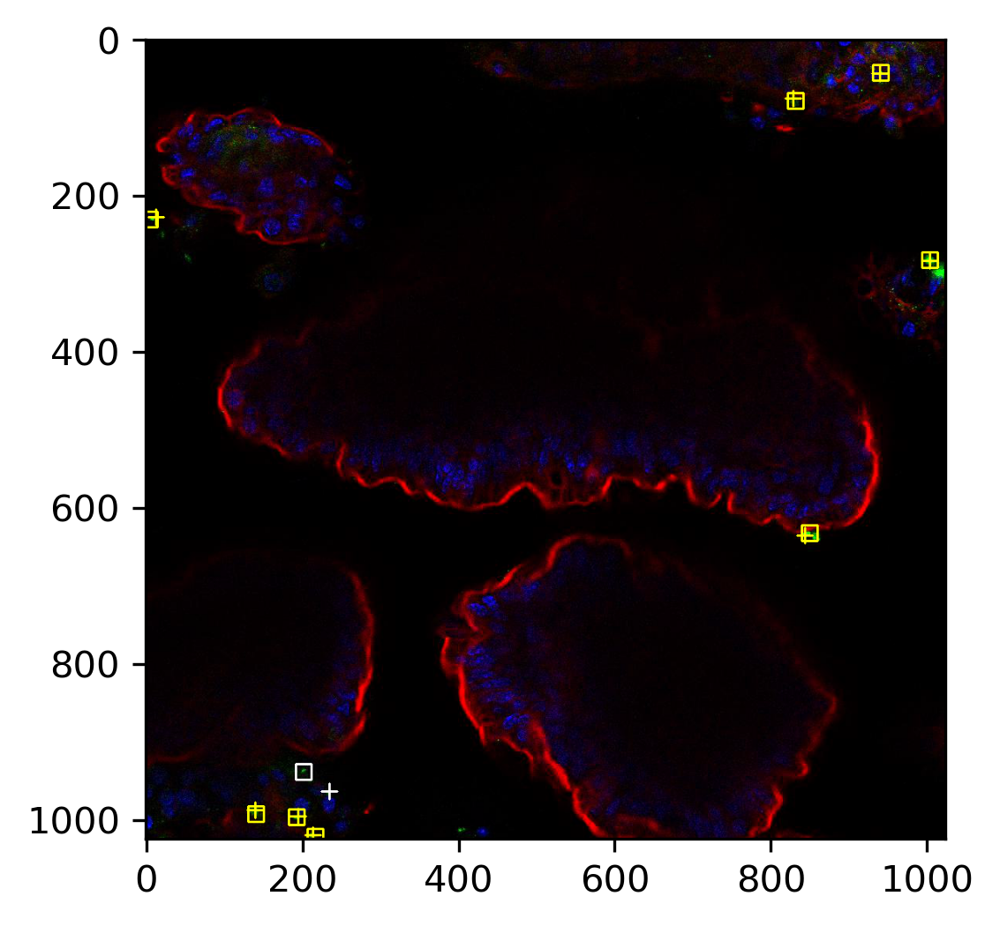

In [72]:
tp,n_points_gt,n_points_pred=evaluate(img_path,predicted_points, gt_points)
tp,n_points_gt,n_points_pred

In [73]:
a

20

# Process all data

Recall: 75.85% Precision: 75.25%


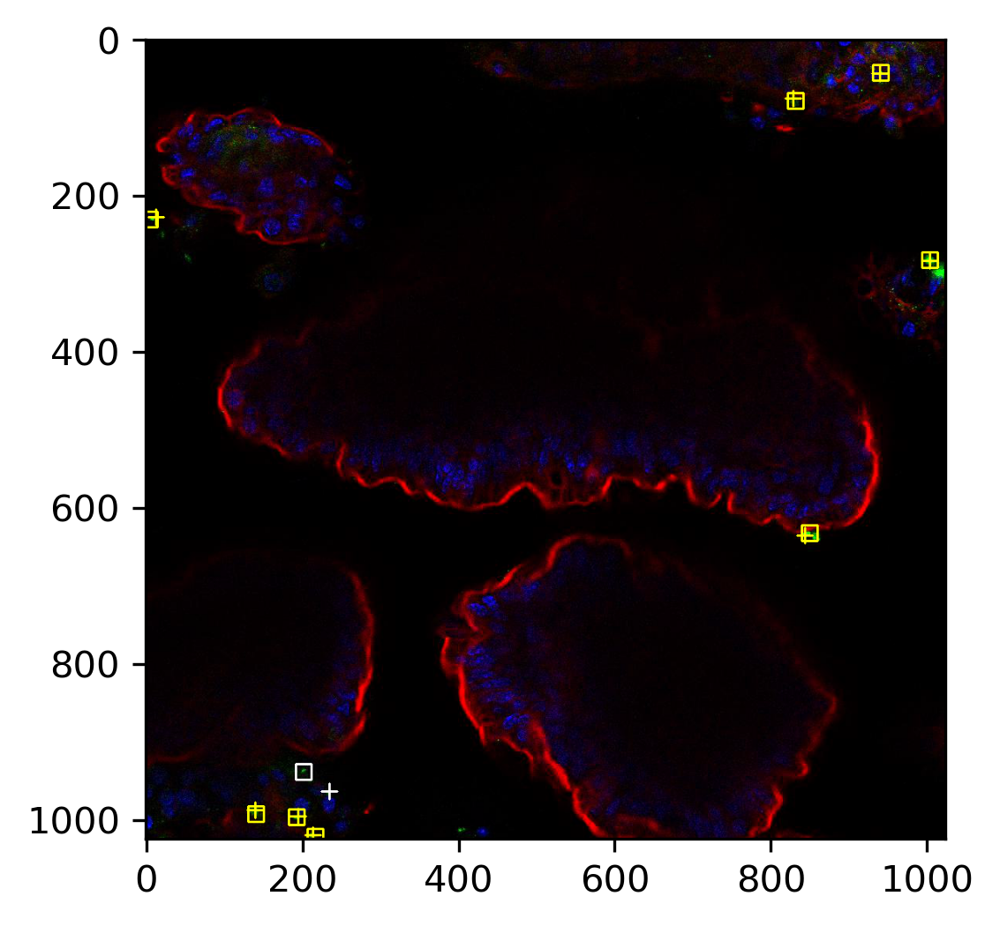

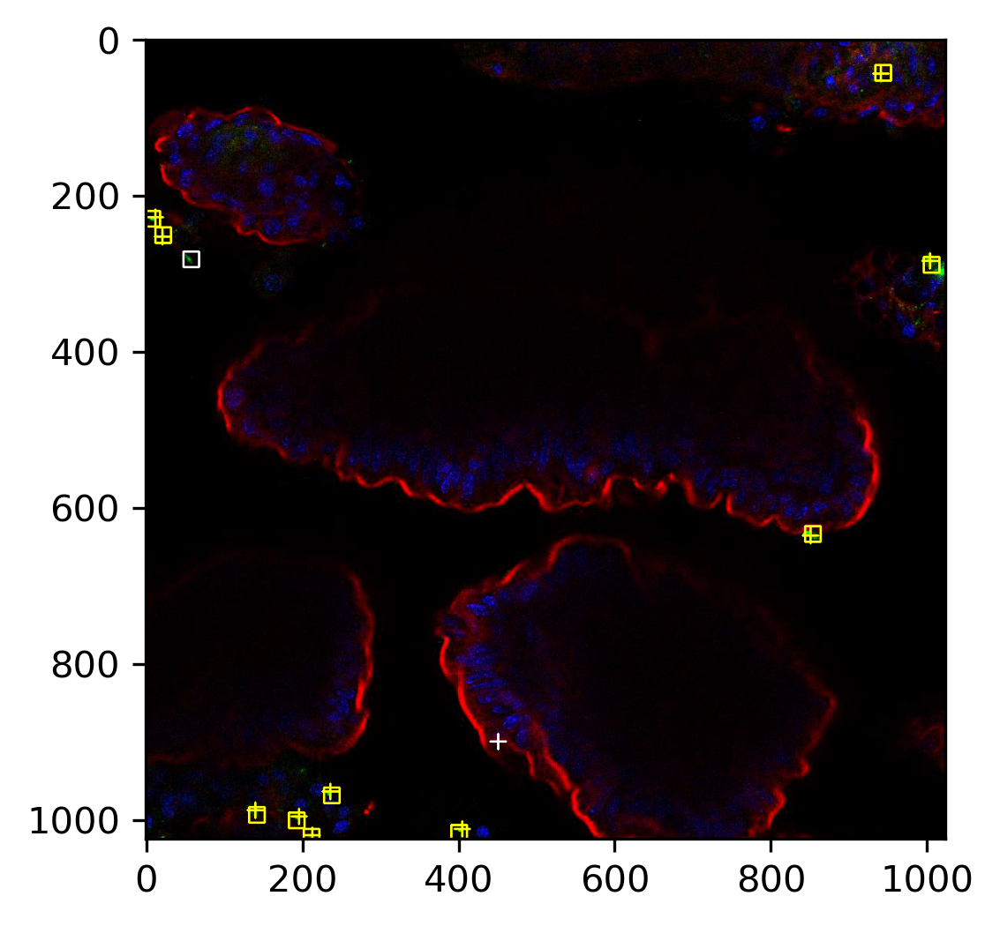

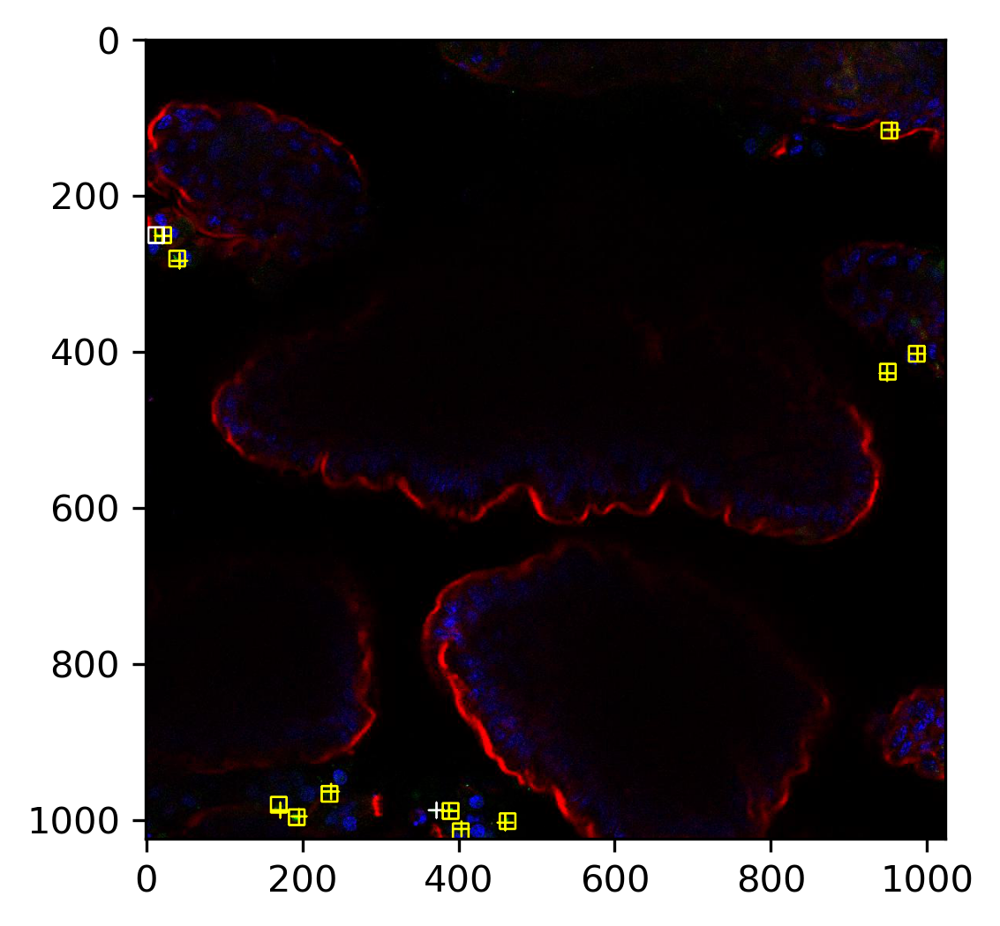

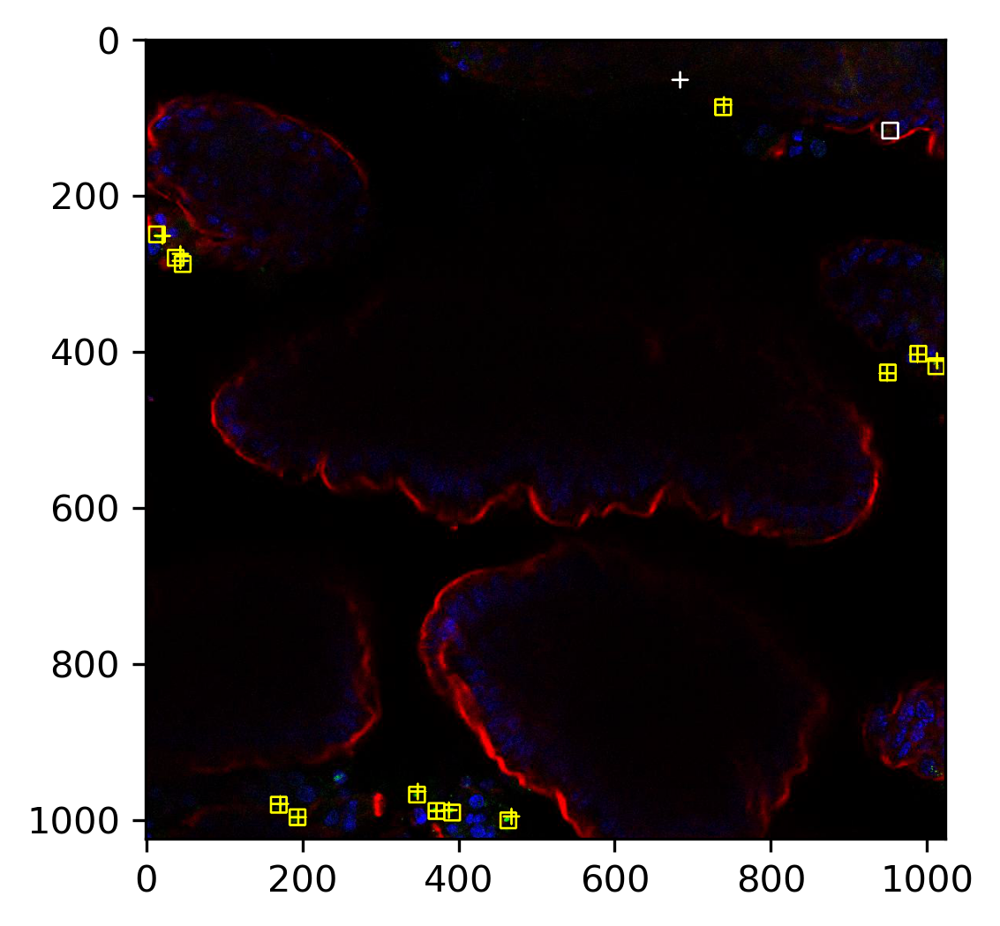

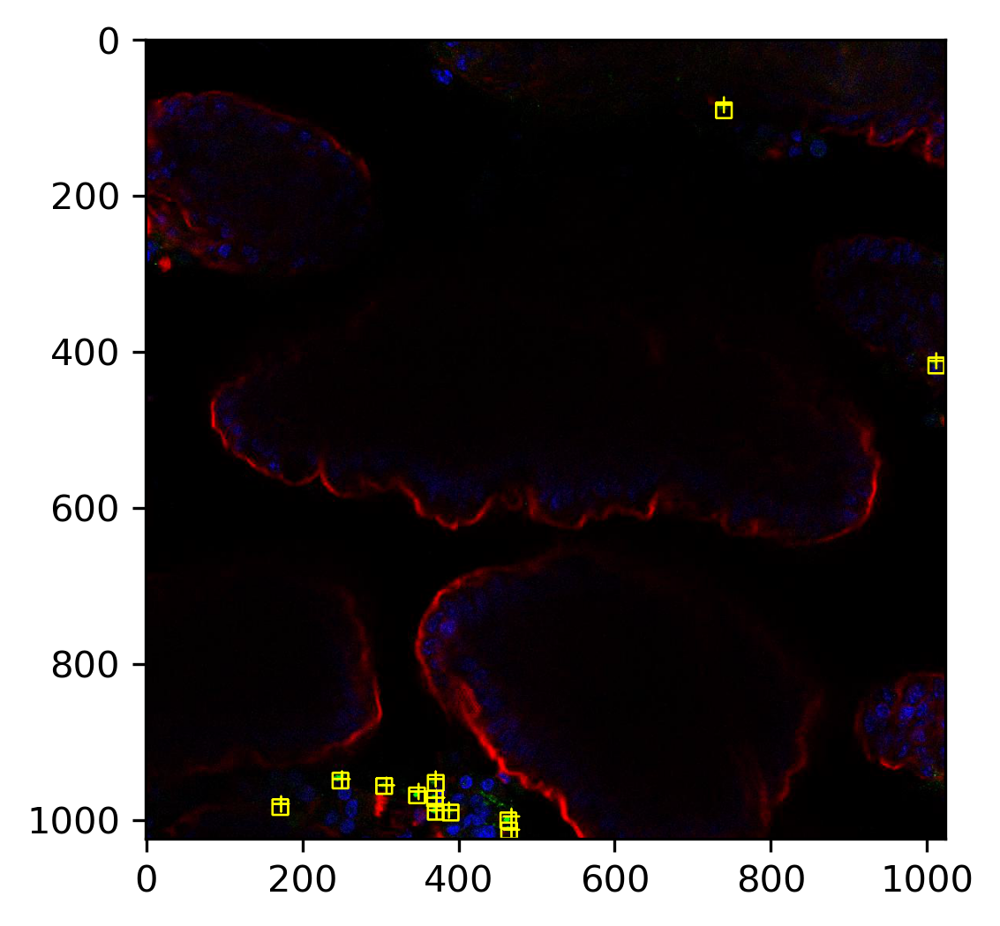

...

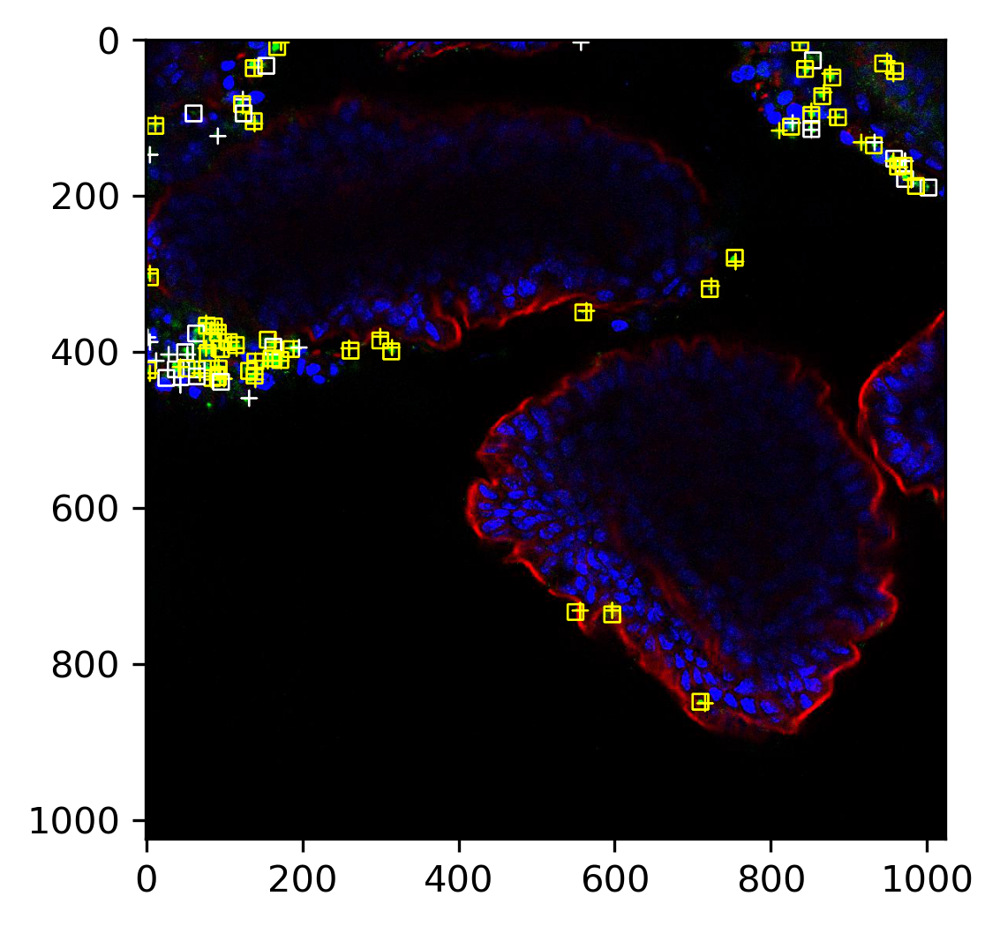

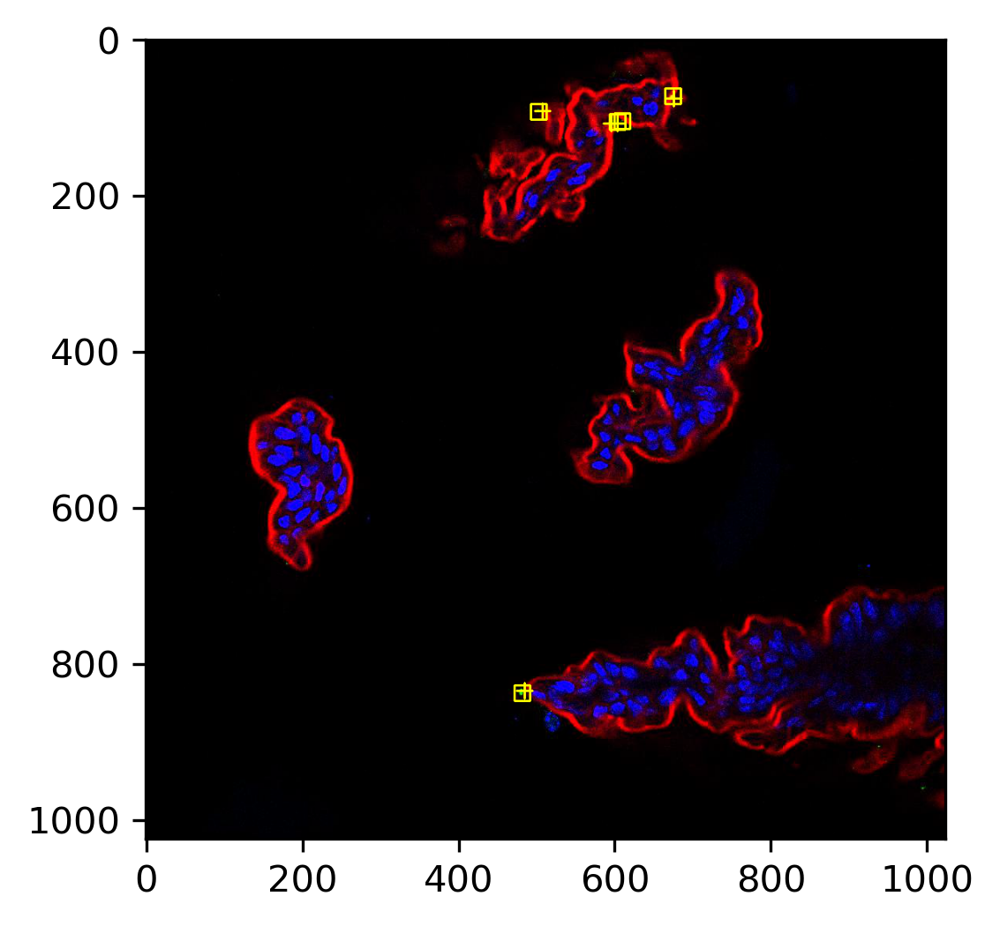

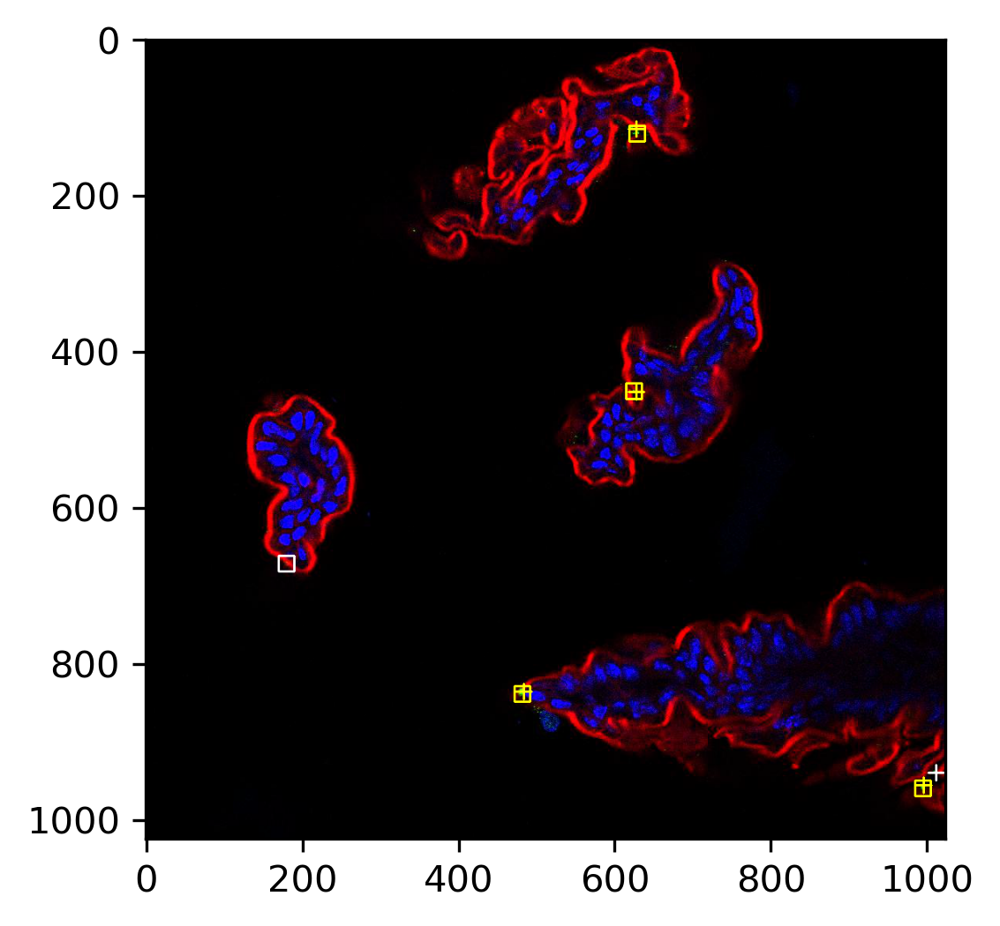

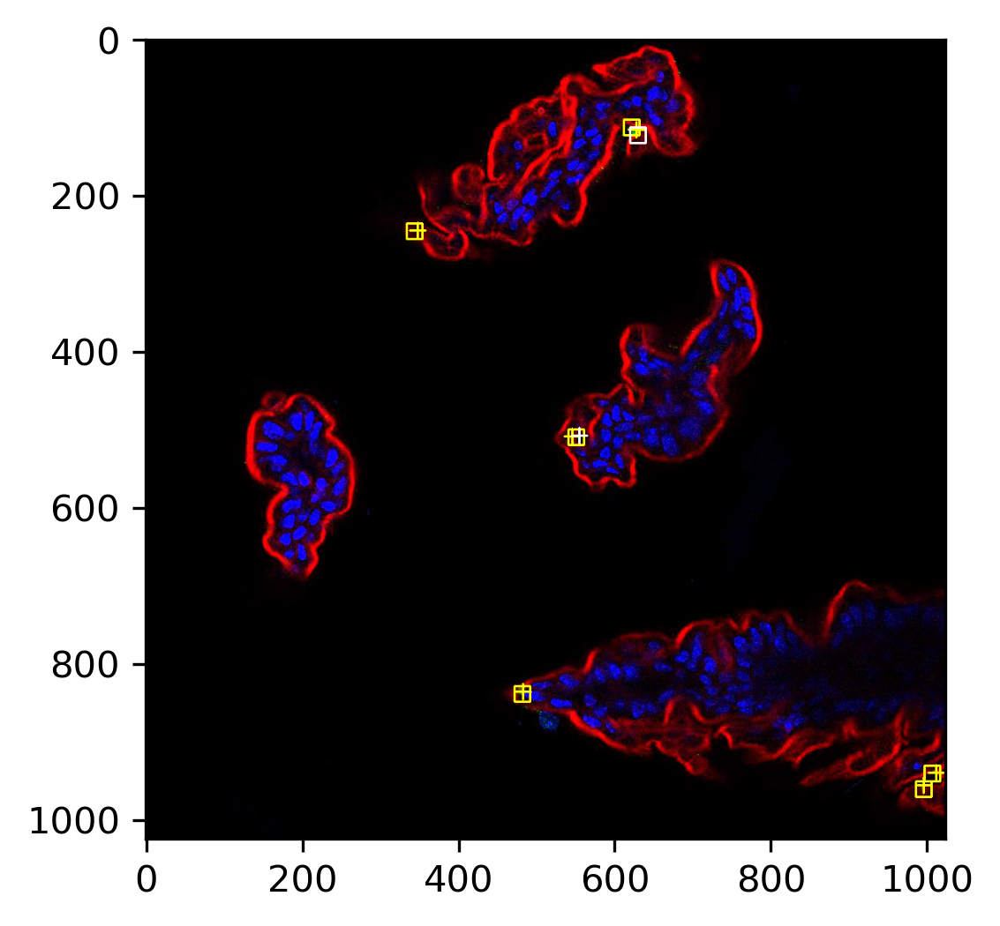

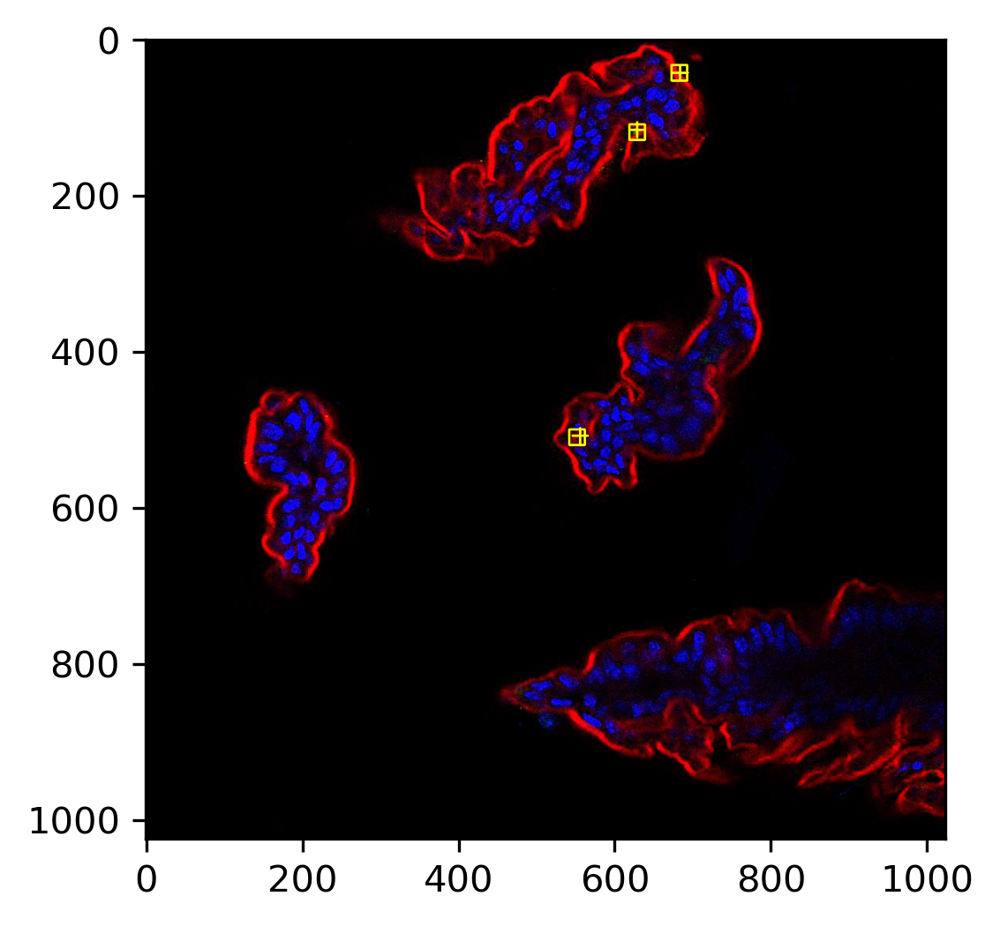

In [74]:
results={'TP':[],'GT':[],'Prediction':[]}
folder="D:/20230426CDI/data/test/"
for image_path in os.listdir(folder):
    if image_path.endswith('jpg'):
        img_path = os.path.join(folder,image_path)

        txt_file = img_path[:-4]+".txt"
        
        predicted_points=predict(img_path,    threshold = 0.45)
        gt_points=get_gt(txt_file)

        tp,n_points_gt,n_points_pred=evaluate(img_path,predicted_points, gt_points)
        
        results['TP'].append(tp)
        results['GT'].append(n_points_gt)
        results['Prediction'].append(n_points_pred)
        
sum_result = pd.DataFrame(results).sum(axis=0)
# sensitivity.append([threshold,sum_result[0]/sum_result[1],sum_result[0]/sum_result[2]])
recall,precision = sum_result['TP']/sum_result['GT'],sum_result['TP']/sum_result['Prediction']
print('Recall: {0:.2%} Precision: {1:.2%}'.format(recall,precision))

In [75]:
pd.DataFrame(results).sum(axis=0)

TP            380
GT            501
Prediction    505
dtype: int64

In [ ]:
recall,precision 

In [ ]:
sensitivity=[]
for threshold in np.arange(0.01, 1, 0.1):
    results={'TP':[],'GT':[],'Prediction':[]}
    folder="D:/20230426CDI/data/test/"
    for image_path in os.listdir(folder):
        if image_path.endswith('jpg'):
            img_path = os.path.join(folder,image_path)

            txt_file = img_path[:-4]+".txt"

            predicted_points=predict(img_path,    threshold = threshold)
            gt_points=get_gt(txt_file)

            tp,n_points_gt,n_points_pred=evaluate(img_path,predicted_points, gt_points)

            results['TP'].append(tp)
            results['GT'].append(n_points_gt)
            results['Prediction'].append(n_points_pred)

    sum_result = pd.DataFrame(results).sum(axis=0)
    # sensitivity.append([threshold,sum_result[0]/sum_result[1],sum_result[0]/sum_result[2]])
    recall,precision = sum_result['TP']/sum_result['GT'],sum_result['TP']/sum_result['Prediction']
    
    sensitivity.append([threshold,recall,precision])
    
    print('Threhold: {} Recall: {:.2%} Precision: {:.2%}'.format(threshold,recall,precision))

In [ ]:
df=pd.DataFrame(sensitivity)
df.columns = ['Thredhold', 'Recall', 'Precision']
plt.plot(df['Thredhold'],df['Precision'],label='Precision')
plt.plot(df['Thredhold'],df['Recall'],label='Recall')
plt.title('Pixel Range={}'.format(str(28.28)))
plt.xlabel("Confidence")
plt.legend()

# Conclusion: 
Compared with the previous results (45%), the model trained on the fully label data achieved a 75% balanced precision and recall, with 0.45 confidence threshold.

# If we test the model on training dataset

In [ ]:
sensitivity=[]
for threshold in np.arange(0.01, 1, 0.1):
    results={'TP':[],'GT':[],'Prediction':[]}
    folder="D:/20230426CDI/data/train/"
    for image_path in os.listdir(folder):
        if image_path.endswith('jpg'):
            img_path = os.path.join(folder,image_path)

            txt_file = img_path[:-4]+".txt"

            predicted_points=predict(img_path,    threshold = threshold)
            gt_points=get_gt(txt_file)

            tp,n_points_gt,n_points_pred=evaluate(img_path,predicted_points, gt_points)

            results['TP'].append(tp)
            results['GT'].append(n_points_gt)
            results['Prediction'].append(n_points_pred)

    sum_result = pd.DataFrame(results).sum(axis=0)
    # sensitivity.append([threshold,sum_result[0]/sum_result[1],sum_result[0]/sum_result[2]])
    recall,precision = sum_result['TP']/sum_result['GT'],sum_result['TP']/sum_result['Prediction']
    
    sensitivity.append([threshold,recall,precision])
    
    print('Threhold: {} Recall: {:.2%} Precision: {:.2%}'.format(threshold,recall,precision))

In [ ]:
df=pd.DataFrame(sensitivity)
df.columns = ['Thredhold', 'Recall', 'Precision']
plt.plot(df['Thredhold'],df['Precision'],label='Precision')
plt.plot(df['Thredhold'],df['Recall'],label='Recall')
plt.title('Pixel Range={}'.format(str(28.28)))
plt.xlabel("Confidence")
plt.legend()